<a href="https://colab.research.google.com/github/ss-Contreras/dropout-knn-svm/blob/main/PruebaScore.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score

In [ ]:
df = pd.read_excel("DF_final_numerico.xlsx")
df.head()

,ID_s,ID2,carrera,promedio_acad,edad,sisben,transporte,semestre,o_voca,e_carrera,...,p_profesores,per_profesores,motivacion,acoso_psc,c_acad,v_semestre,habilidades_pa,adaptacion_u,campus,recomendación_u
0,2,1,0,3.7,28,25,3,4,5,17,...,8,10,10,10,4,8,9,9,9,9
1,2,2,1,3.7,20,27,5,8,5,17,...,6,10,4,10,5,10,10,7,10,10
2,2,3,0,3.7,20,27,4,2,5,17,...,8,8,10,2,2,8,8,8,8,9
3,2,4,0,3.7,20,0,0,5,5,17,...,5,10,10,10,10,5,7,10,10,6
4,2,5,0,3.7,18,2,0,2,5,17,...,5,5,6,8,4,8,6,7,8,6


In [ ]:
df = df.drop(["ID_s", "ID2", "promedio_acad", "e_acad", "p_cargo", "i_carrera", "carrera", "transporte", "o_voca", "e_negativas", "semestre", "e_carrera", "g_afectacion", "ingresos", "t_estudios", "h_semanal", "a_familiar", "a_profesores", "embarazo_des", "aban_inter", "c_universidad", "m_calificacion", "c_universidad", "m_calificacion", "c_profesores", "dificultades_t", "c_familiar", "v_semestre", "financiacion", "autopercepcion", "t_hijos", "c_acad", "edad", "acoso_psc", "adaptacion_u", "d_acad"], axis=1)

In [ ]:
print(f"Filas: {df.shape[0]}, Columnas: {df.shape[1]}")


Filas: 483, Columnas: 44


In [ ]:
print(df['motivacion'].value_counts())


motivacion
10    186
8      83
9      68
7      50
6      39
5      37
4      10
1       5
3       3
2       2
Name: count, dtype: int64


In [ ]:
X = df.drop(['motivacion'], axis = 1)
y = df[['motivacion']]
df.head()

,sisben,razon,r_carrera,m_residencia,p_profesores,per_profesores,motivacion,habilidades_pa,campus,recomendación_u
0,25,11,17,19,8,10,10,9,9,9
1,27,21,17,4,6,10,4,10,10,10
2,27,21,17,6,8,8,10,8,8,9
3,0,21,17,18,5,10,10,7,10,6
4,2,21,8,8,5,5,6,6,8,6


In [ ]:
X.head()

,sisben,razon,r_carrera,m_residencia,p_profesores,per_profesores,habilidades_pa,campus,recomendación_u
0,25,11,17,19,8,10,9,9,9
1,27,21,17,4,6,10,10,10,10
2,27,21,17,6,8,8,8,8,9
3,0,21,17,18,5,10,7,10,6
4,2,21,8,8,5,5,6,8,6


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
df.shape

(483, 10)

In [ ]:
df.columns

Index(['sisben', 'razon', 'r_carrera', 'm_residencia', 'p_profesores',
       'per_profesores', 'motivacion', 'habilidades_pa', 'campus',
       'recomendación_u'],
      dtype='object')

# SVM


In [ ]:
parametros = {
    'C': [0.01, 0.1],
    'gamma': [1, 0.1],
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid']
}

modelo_svm = svm.SVC()
grid = GridSearchCV(modelo_svm, parametros, refit=True, verbose=2, cv=5)
grid.fit(X_train, y_train)

In [ ]:
parametros = {
    'C': [0.01, 0.1],
    'gamma': [1, 0.1],
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid']
}

In [ ]:
modelo_svm = svm.SVC()

In [ ]:
grid = GridSearchCV(modelo_svm, parametros, refit=True, verbose = 2, cv = 5)

In [ ]:
grid.fit(X_train, y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] END .....................C=0.01, gamma=1, kernel=linear; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .....................C=0.01, gamma=1, kernel=linear; total time=   0.1s
[CV] END .....................C=0.01, gamma=1, kernel=linear; total time=   0.1s
[CV] END .....................C=0.01, gamma=1, kernel=linear; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .....................C=0.01, gamma=1, kernel=linear; total time=   0.1s
[CV] END ........................C=0.01, gamma=1, kernel=rbf; total time=   0.1s
[CV] END ........................C=0.01, gamma=1, kernel=rbf; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

[CV] END ........................C=0.01, gamma=1, kernel=rbf; total time=   0.1s
[CV] END ........................C=0.01, gamma=1, kernel=rbf; total time=   0.0s
[CV] END ........................C=0.01, gamma=1, kernel=rbf; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .......................C=0.01, gamma=1, kernel=poly; total time=   7.4s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .......................C=0.01, gamma=1, kernel=poly; total time=   7.4s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .......................C=0.01, gamma=1, kernel=poly; total time=   3.8s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .......................C=0.01, gamma=1, kernel=poly; total time=   5.2s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .......................C=0.01, gamma=1, kernel=poly; total time=   6.5s
[CV] END ....................C=0.01, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END ....................C=0.01, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END ....................C=0.01, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END ....................C=0.01, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END ....................C=0.01, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END ...................C=0.01, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END ...................C=0.01, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END ...................C=0.01, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END ...................C=0.01, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END ...................C=0.01, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END ......................C=0.01, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ...................

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

[CV] END ......................C=0.01, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.01, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END ......................C=0.01, gamma=0.1, kernel=rbf; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .....................C=0.01, gamma=0.1, kernel=poly; total time=   1.1s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .....................C=0.01, gamma=0.1, kernel=poly; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .....................C=0.01, gamma=0.1, kernel=poly; total time=   1.2s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .....................C=0.01, gamma=0.1, kernel=poly; total time=   1.5s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END .....................C=0.01, gamma=0.1, kernel=poly; total time=   1.5s
[CV] END ..................C=0.01, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ..................C=0.01, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ..................C=0.01, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ..................C=0.01, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ..................C=0.01, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   4.7s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   5.6s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   4.0s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   6.7s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   4.8s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END ....................C=0.1, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END ....................C=0.1, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END ....................C=0.1, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END ....................C=0.1, gamma=0.1, kernel=linear; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

[CV] END ....................C=0.1, gamma=0.1, kernel=linear; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

[CV] END ......................C=0.1, gamma=0.1, kernel=poly; total time=   4.1s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ......................C=0.1, gamma=0.1, kernel=poly; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ......................C=0.1, gamma=0.1, kernel=poly; total time=   3.5s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ......................C=0.1, gamma=0.1, kernel=poly; total time=   2.2s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[CV] END ......................C=0.1, gamma=0.1, kernel=poly; total time=   3.9s
[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.01, 0.1], 'gamma': [1, 0.1],
                         'kernel': ['linear', 'rbf', 'poly', 'sigmoid']},
             verbose=2)

In [ ]:
grid.best_params_

{'C': 0.01, 'gamma': 1, 'kernel': 'linear'}

In [ ]:
results = pd.DataFrame(grid.cv_results_)

# Muestras los puntajes de cada modelo
print(results[['params', 'mean_test_score', 'std_test_score']])

                                            params  mean_test_score  \
0      {'C': 0.01, 'gamma': 1, 'kernel': 'linear'}         0.388678   
1         {'C': 0.01, 'gamma': 1, 'kernel': 'rbf'}         0.386014   
2        {'C': 0.01, 'gamma': 1, 'kernel': 'poly'}         0.295438   
3     {'C': 0.01, 'gamma': 1, 'kernel': 'sigmoid'}         0.386014   
4    {'C': 0.01, 'gamma': 0.1, 'kernel': 'linear'}         0.388678   
5       {'C': 0.01, 'gamma': 0.1, 'kernel': 'rbf'}         0.386014   
6      {'C': 0.01, 'gamma': 0.1, 'kernel': 'poly'}         0.292840   
7   {'C': 0.01, 'gamma': 0.1, 'kernel': 'sigmoid'}         0.386014   
8       {'C': 0.1, 'gamma': 1, 'kernel': 'linear'}         0.378388   
9          {'C': 0.1, 'gamma': 1, 'kernel': 'rbf'}         0.386014   
10        {'C': 0.1, 'gamma': 1, 'kernel': 'poly'}         0.295438   
11     {'C': 0.1, 'gamma': 1, 'kernel': 'sigmoid'}         0.386014   
12    {'C': 0.1, 'gamma': 0.1, 'kernel': 'linear'}         0.378388   
13    

In [ ]:
print(results.columns)

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_C', 'param_gamma', 'param_kernel', 'params', 'split0_test_score',
       'split1_test_score', 'split2_test_score', 'split3_test_score',
       'split4_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score'],
      dtype='object')


In [ ]:
criterios_unicos = results['param_C'].unique()

valores_criterio = {}

for criterio in criterios_unicos:
    df_filtrado = results[results['param_C'] == criterio]

    # Valores máximos de los splits
    valores_maximos = df_filtrado[['mean_test_score']].max()
    valores_criterio[criterio] = valores_maximos

print(valores_criterio)

{0.01: mean_test_score    0.388678
dtype: float64, 0.1: mean_test_score    0.386014
dtype: float64}


# KNN

In [ ]:
parametros = {'n_neighbors': [int(y) for y in range(1,200)],
              'weights': ['uniform','distance'],
              'algorithm': ['auto', 'ball_tree','kd_tree','brute'],
              'p': [1, 2]
}

In [ ]:
modelo_k = KNeighborsClassifier()

In [ ]:
grid_k = GridSearchCV(modelo_k, parametros, refit=True, verbose = 2, cv = 5)

In [ ]:
grid_k.fit(X_train, y_train)

Fitting 5 folds for each of 3184 candidates, totalling 15920 fits
[CV] END algorithm=auto, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.

[CV] END algorithm=auto, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=3, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=au

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=au

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=au

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorit

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=21, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=21, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=21, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=21, p=2, weights=distance; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=21, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=21, p=2, weights=distance; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=21, p=2, weights=distance; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=21, p=2, weights=distance; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


[CV] END algorithm=auto, n_neighbors=22, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=22, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=22, p=1, weights=uniform; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


[CV] END algorithm=auto, n_neighbors=22, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=2, weights=uniform; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=22, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=22, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=22, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=33, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=34, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=41, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=auto, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END a

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=97, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=1, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=101, p=2, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=1, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=103, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=1, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=1, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=1, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=109, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=111, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=2, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=118, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=121, p=2, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=124, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=1, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=126, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=1, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=129, p=2, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=2, weights=uniform; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=131, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=133, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=135, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=137, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=139, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=2, weights=uniform; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=1, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=142, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=2, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=146, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=148, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=2, weights=uniform; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=150, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=1, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=152, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=154, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=auto, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=1, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=auto, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=157, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=auto, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=161, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=163, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=165, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=2, weights=uniform; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=1, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=1, weights=uniform; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=1, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=171, p=2, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=2, weights=uniform; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=173, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=1, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=175, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=1, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=179, p=2, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=uniform; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=181, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=1, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=1, weights=uniform; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=185, p=1, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=186, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=1, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=1, weights=uniform; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=1, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=2, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=1, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=auto, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=2,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=2,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=3, p=2

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=5, p=2

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=6, p=2,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=2,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=8, p=2

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=ball_tree, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=2

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=ball_tree, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=80, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=1, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=ball_tree, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=ball_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighb

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neigh

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=ball_tree, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=118, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=ball_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=123, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=126, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=144, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=153, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=157, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tre

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=ball_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=1, weight

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=1, weights=uniform; total 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=2, p=2, weights=distance; tota

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=2, weights=uniform; total 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=1, weights=distance; total

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=1, weights=uniform; total 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=5, p=2, weights=distance; total

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=2, weights=uniform; total 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=1, weights=distance; tota

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=1, weights=uniform; total 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=2, weights=uniform; total 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=1, weights=distance; tota

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=uniform; tot

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=10, p=2, weights=dis

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=2, weights=un

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=12, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=15, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=2, weights=un

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=17, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=19, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=1, weights=dis

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=un

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=25, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=30, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=43, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=46, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=47, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=1, weights=dis

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=un

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=63, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=69, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=72, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=73, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=75, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=88, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=uni

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=di

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=99, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=101, p=2,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=104, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=108, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=1, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=114, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=115, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=116, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=123, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=124, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=2,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=140, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=142, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=143, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=147, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=153, p=2,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=154, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=163, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=164, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=1,

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=170, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=175, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=191, p=2

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END al

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=1, weights=distance; total time=   0.0s
[CV] END 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=3, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=4, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=5, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=6, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=7, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=8, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=9, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=10, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=12, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=13, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=14, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=15, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=16, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=16, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=17, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=18, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=18, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=19, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=19, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=19, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=20, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=20, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=21, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=21, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=21, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=22, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=22, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=23, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=24, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=25, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=25, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=26, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=27, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=28, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=29, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=29, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=30, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=30, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=31, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=32, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=33, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=34, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=35, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=36, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=36, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=37, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=38, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=39, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=40, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=41, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=41, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=42, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=43, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=44, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=45, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=46, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=46, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=47, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=47, p=2, weights=distance; total time=   0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=48, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=49, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=49, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=50, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=50, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=50, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=51, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=51, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=52, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=53, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=53, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=54, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=55, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=56, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=57, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=58, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=59, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=60, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=60, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=61, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=62, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=63, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=64, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=65, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=65, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=66, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=67, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=68, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=69, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=70, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=70, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=71, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=71, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=72, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=72, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=73, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=74, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=75, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=76, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=76, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=77, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=77, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=78, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=1, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=79, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=80, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=81, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=82, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=83, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=83, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=84, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=85, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=85, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=86, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=86, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=86, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=87, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=87, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=88, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=1, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=89, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=89, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=90, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=91, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=91, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=1, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=92, p=2, weights=distance; total time=   0.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=93, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=93, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=94, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=95, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=96, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=97, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=98, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=98, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=98, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=99, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=2, weights=uniform; total 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=100, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=101, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=102, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=102, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=103, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=103, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=103, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=104, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=104, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=104, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=105, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=106, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=106, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=106, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=107, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=1, weights=uniform; total 

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=108, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=109, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=109, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=109, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=110, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=111, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=1, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=112, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=113, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=113, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=114, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=115, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=115, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=116, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=116, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=117, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=118, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=119, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=120, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=121, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=121, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=122, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=123, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=124, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=124, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=125, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=126, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=127, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=128, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=129, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=130, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=130, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=131, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=132, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=133, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=134, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=134, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=135, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=135, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=136, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=136, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=1, weights=uniform; total

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=137, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=138, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=138, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=139, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=139, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=140, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=141, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=141, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=142, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=142, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=142, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=143, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=144, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=144, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=145, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=146, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=147, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=147, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=148, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=148, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=149, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=150, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=151, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=152, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=153, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=154, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=154, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=154, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=155, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=156, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=157, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=158, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=159, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=159, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=1, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=160, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=160, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=161, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=161, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=1, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=162, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=163, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=164, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=165, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=165, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=166, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=166, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=167, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=168, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=168, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=169, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=170, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=171, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=172, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=2, weights=uniform; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=173, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=174, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=175, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=175, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=176, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=176, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=176, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=177, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=178, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=178, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=179, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=180, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=180, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=181, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=181, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=182, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=183, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=183, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=2, weights=distance; total time=   0.0s

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 


[CV] END algorithm=brute, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=184, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=185, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=185, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=186, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=187, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=188, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=188, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=188, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=189, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=189, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=190, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=191, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=192, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=193, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=194, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=195, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=195, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=196, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=196, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=196, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=197, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=1, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=2, weights=uniform; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=198, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=1, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=199, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

[CV] END algorithm=brute, n_neighbors=199, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, n_neighbors=199, p=2, weights=distance; total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30, ...],
                         'p': [1, 2], 'weights': ['uniform', 'distance']},
             verbose=2)

In [ ]:
# Hacemos predicciones con los datos de prueba
predicciones = grid.predict(X_test)

# Evaluamos el modelo
print("Exactitud:", metrics.accuracy_score(y_test, predicciones))

Exactitud: 0.3711340206185567


In [ ]:
grid_k.best_params_

{'algorithm': 'auto', 'n_neighbors': 82, 'p': 2, 'weights': 'distance'}

In [ ]:
grid_k.best_score_

0.4118215118215119

In [ ]:
df.head()

,sisben,razon,r_carrera,m_residencia,p_profesores,per_profesores,motivacion,habilidades_pa,campus,recomendación_u
0,25,11,17,19,8,10,10,9,9,9
1,27,21,17,4,6,10,4,10,10,10
2,27,21,17,6,8,8,10,8,8,9
3,0,21,17,18,5,10,10,7,10,6
4,2,21,8,8,5,5,6,6,8,6


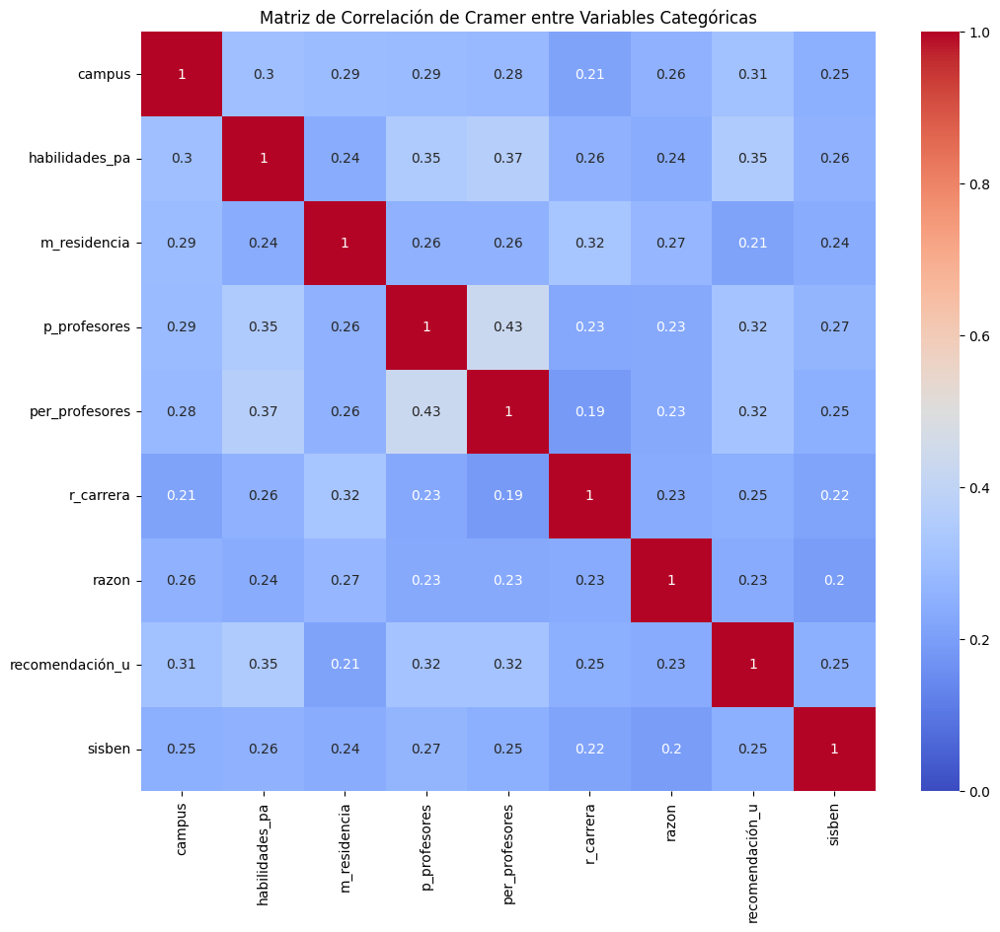

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt


categorical_columns = df.select_dtypes(include=['int', 'object']).columns
categorical_columns = categorical_columns.difference(['ID_s', 'ID2', 'motivacion'])

def cramers_v(confusion_matrix):
    chi2 = stats.chi2_contingency(confusion_matrix, correction=False)[0]
    n = confusion_matrix.sum()
    r, k = confusion_matrix.shape
    return np.sqrt(chi2 / (n * (min(k - 1, r - 1))))

cramers_v_matrix = pd.DataFrame(np.zeros((len(categorical_columns), len(categorical_columns))),
                                index=categorical_columns, columns=categorical_columns)

for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 != col2:
            confusion_matrix = pd.crosstab(df[col1], df[col2])
            if confusion_matrix.shape[0] > 1 and confusion_matrix.shape[1] > 1:
                cramers_v_matrix.loc[col1, col2] = cramers_v(confusion_matrix.values)
            else:
                cramers_v_matrix.loc[col1, col2] = np.nan
        else:
            cramers_v_matrix.loc[col1, col2] = 1.0

plt.figure(figsize=(12, 10))
sns.heatmap(cramers_v_matrix, annot=True, cmap='coolwarm', vmin=0, vmax=1)
plt.title('Matriz de Correlación de Cramer entre Variables Categóricas')
plt.show()


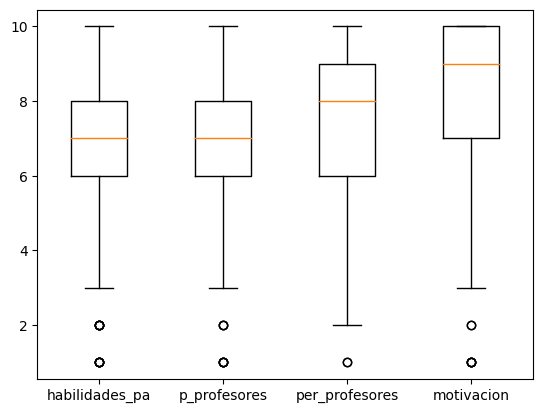

In [ ]:
plt.boxplot([df['habilidades_pa'], df['p_profesores'], df['per_profesores'], df['motivacion']],
            labels=['habilidades_pa', 'p_profesores', 'per_profesores', 'motivacion'])
plt.show()

# Pruebas para El dataset

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
X = df.drop(['motivacion'], axis = 1)
y = df[['motivacion']]

In [ ]:
df.columns

Index(['sisben', 'razon', 'r_carrera', 'm_residencia', 'p_profesores',
       'per_profesores', 'motivacion', 'habilidades_pa', 'campus',
       'recomendación_u'],
      dtype='object')

Tamaño del dataset original: 483
motivacion
10    186
8      83
9      68
7      50
6      39
5      37
4      10
1       5
3       3
2       2
Name: count, dtype: int64
Tamaño del dataset después de SMOTE: 1860
motivacion
10    186
4     186
6     186
8     186
5     186
9     186
7     186
2     186
3     186
1     186
Name: count, dtype: int64


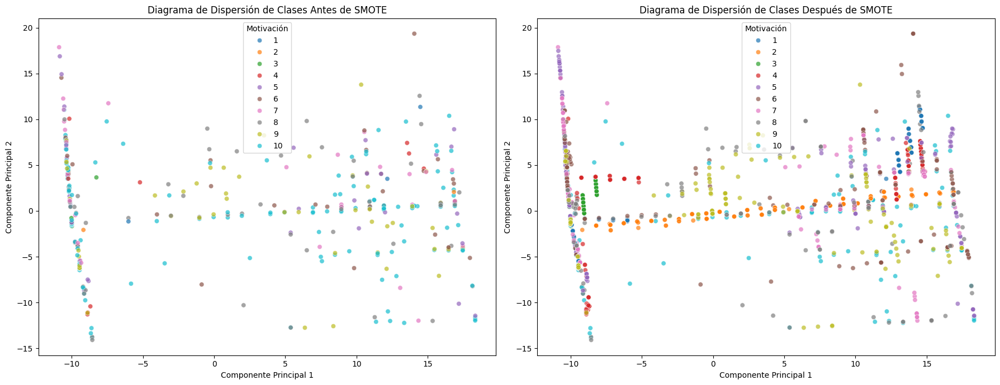

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE

X = df.drop(['motivacion'], axis=1)
y = df[['motivacion']]

pca = PCA(n_components=2)
X_pca_before = pca.fit_transform(X)

df_pca_before = pd.DataFrame(X_pca_before, columns=['PCA1', 'PCA2'])
df_pca_before['motivacion'] = y

print(f"Tamaño del dataset original: {df.shape[0]}")
print(df['motivacion'].value_counts())

min_samples = y['motivacion'].value_counts().min()
k_neighbors = min_samples - 1

smote = SMOTE(random_state=42, k_neighbors=k_neighbors, sampling_strategy='auto')
X_res, y_res = smote.fit_resample(X, y)

df_res = pd.DataFrame(X_res, columns=X.columns)
df_res['motivacion'] = y_res

X_pca_after = pca.transform(X_res)

df_pca_after = pd.DataFrame(X_pca_after, columns=['PCA1', 'PCA2'])
df_pca_after['motivacion'] = y_res

print(f"Tamaño del dataset después de SMOTE: {df_res.shape[0]}")
print(df_res['motivacion'].value_counts())

fig, ax = plt.subplots(1, 2, figsize=(18, 7))

sns.scatterplot(data=df_pca_before, x='PCA1', y='PCA2', hue='motivacion', palette='tab10', alpha=0.7, ax=ax[0])
ax[0].set_title('Diagrama de Dispersión de Clases Antes de SMOTE')
ax[0].set_xlabel('Componente Principal 1')
ax[0].set_ylabel('Componente Principal 2')
ax[0].legend(title='Motivación')

sns.scatterplot(data=df_pca_after, x='PCA1', y='PCA2', hue='motivacion', palette='tab10', alpha=0.7, ax=ax[1])
ax[1].set_title('Diagrama de Dispersión de Clases Después de SMOTE')
ax[1].set_xlabel('Componente Principal 1')
ax[1].set_ylabel('Componente Principal 2')
ax[1].legend(title='Motivación')

plt.tight_layout()
plt.show()


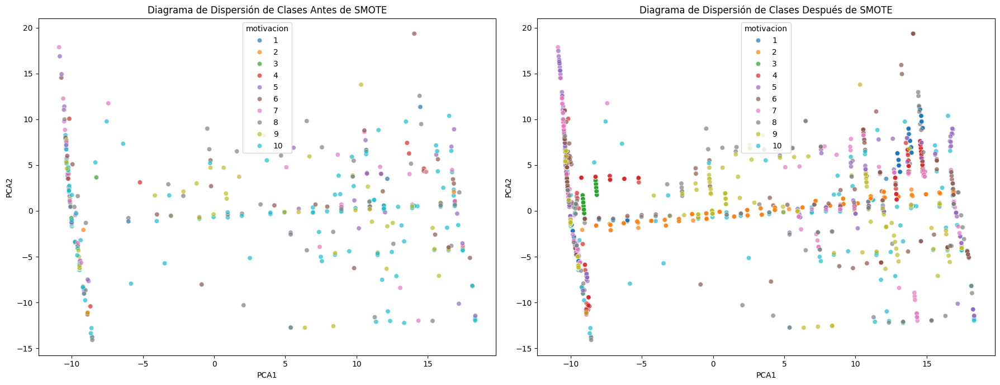

In [ ]:
X_pca_after = pca.transform(X_res)

df_pca_after = pd.DataFrame(X_pca_after, columns=['PCA1', 'PCA2'])
df_pca_after['motivacion'] = y_res

fig, ax = plt.subplots(1, 2, figsize=(18, 7))

sns.scatterplot(data=df_pca_before, x='PCA1', y='PCA2', hue='motivacion', palette='tab10', alpha=0.7, ax=ax[0])
ax[0].set_title('Diagrama de Dispersión de Clases Antes de SMOTE')

sns.scatterplot(data=df_pca_after, x='PCA1', y='PCA2', hue='motivacion', palette='tab10', alpha=0.7, ax=ax[1])
ax[1].set_title('Diagrama de Dispersión de Clases Después de SMOTE')

plt.tight_layout()
plt.show()


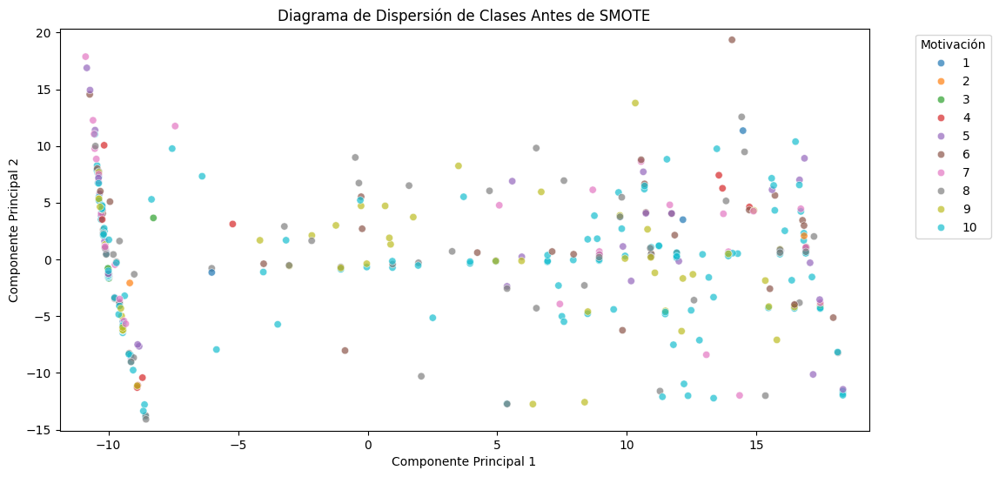

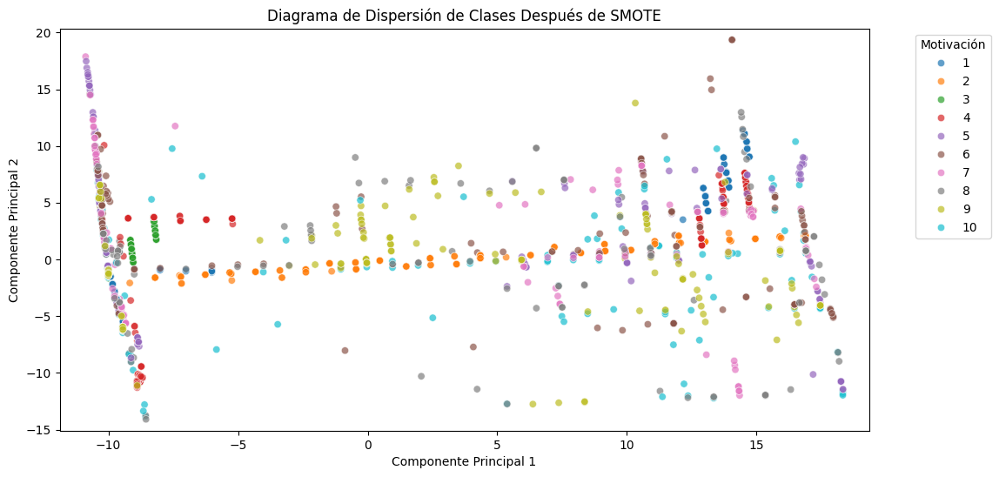

In [ ]:
df_pca_before = pd.DataFrame(X_pca_before, columns=['PCA1', 'PCA2'])
df_pca_before['motivacion'] = y

df_pca_after = pd.DataFrame(X_pca_after, columns=['PCA1', 'PCA2'])
df_pca_after['motivacion'] = y_res

plt.figure(figsize=(12, 6))
sns.scatterplot(data=df_pca_before, x='PCA1', y='PCA2', hue='motivacion', palette='tab10', alpha=0.7)
plt.title('Diagrama de Dispersión de Clases Antes de SMOTE')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.legend(title='Motivación', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlim(df_pca_before['PCA1'].min() - 1, df_pca_before['PCA1'].max() + 1)
plt.ylim(df_pca_before['PCA2'].min() - 1, df_pca_before['PCA2'].max() + 1)
plt.show()

plt.figure(figsize=(12, 6))
sns.scatterplot(data=df_pca_after, x='PCA1', y='PCA2', hue='motivacion', palette='tab10', alpha=0.7)
plt.title('Diagrama de Dispersión de Clases Después de SMOTE')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.legend(title='Motivación', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlim(df_pca_after['PCA1'].min() - 1, df_pca_after['PCA1'].max() + 1)
plt.ylim(df_pca_after['PCA2'].min() - 1, df_pca_after['PCA2'].max() + 1)
plt.show()


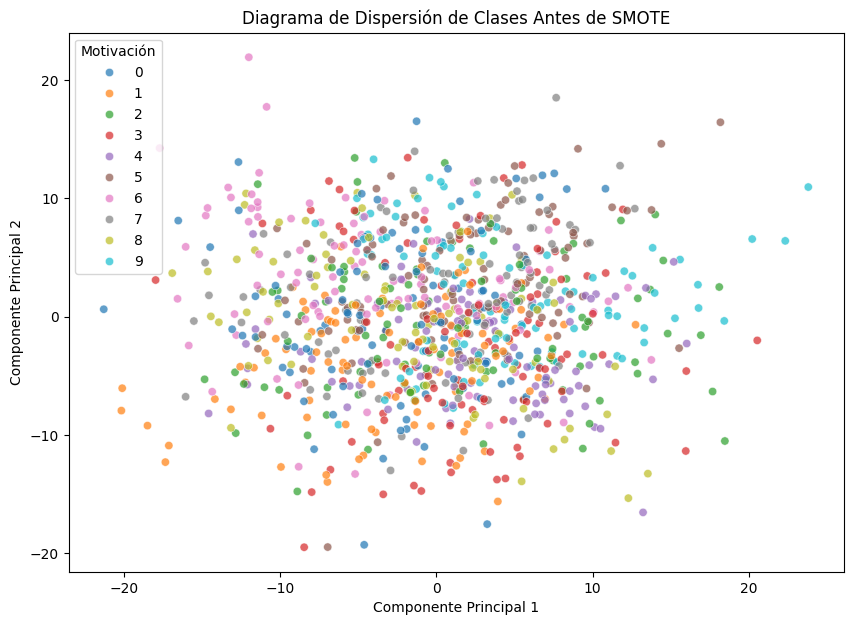

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE
from sklearn.datasets import make_classification
import pandas as pd

X, y = make_classification(n_classes=10, n_samples=1000, n_features=20, n_informative=10, n_redundant=10, random_state=42)

y = pd.Series(y)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

df_pca_before = pd.DataFrame(X_pca, columns=['PCA1', 'PCA2'])
df_pca_before['Motivacion'] = y

plt.figure(figsize=(10, 7))
sns.scatterplot(data=df_pca_before, x='PCA1', y='PCA2', hue='Motivacion', palette='tab10', alpha=0.7)
plt.title('Diagrama de Dispersión de Clases Antes de SMOTE')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.legend(title='Motivación')
plt.show()


In [ ]:
smote = SMOTE(random_state=42, k_neighbors=5, sampling_strategy='auto')
X_res, y_res = smote.fit_resample(X, y)

ValueError: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.datasets import make_classification
import pandas as pd

# Crear un dataset de ejemplo
X, y = make_classification(n_classes=10, n_samples=1000, n_features=20, n_informative=10, n_redundant=10, random_state=42)

# Convertir y a Serie si es necesario
y = pd.Series(y)

# Verificar las clases presentes en y
classes_present = set(y)
print("Clases presentes en el dataset:", classes_present)

# Ajustar sampling_strategy solo para las clases presentes
sampling_strategy = {cls: 1000 for cls in classes_present}

smote = SMOTE(random_state=42, k_neighbors=5, sampling_strategy=sampling_strategy)
X_res, y_res = smote.fit_resample(X, y)


Clases presentes en el dataset: {0, 1, 2, 3, 4, 5, 6, 7, 8, 9}


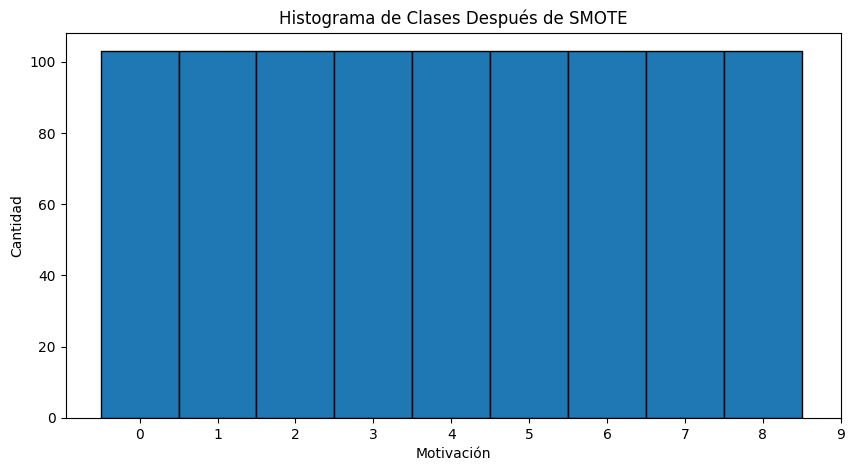

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Histograma de la distribución de clases después de SMOTE
plt.figure(figsize=(10, 5))
plt.hist(y_res, bins=np.arange(y_res.min(), y_res.max() + 1) - 0.5, edgecolor='black')
plt.title('Histograma de Clases Después de SMOTE')
plt.xlabel('Motivación')
plt.ylabel('Cantidad')
plt.xticks(np.arange(y_res.min(), y_res.max() + 1))
plt.show()


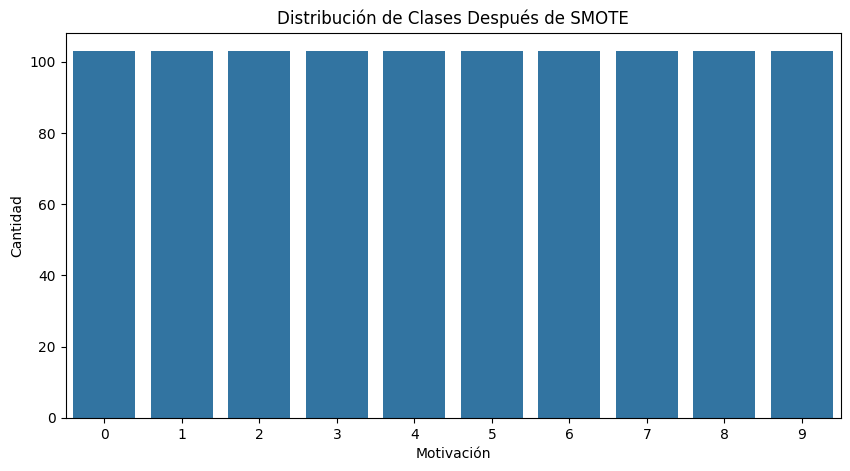

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE
from sklearn.datasets import make_classification
import pandas as pd

# Crear un dataset de ejemplo
X, y = make_classification(n_classes=10, n_samples=1000, n_features=20, n_informative=10, n_redundant=10, random_state=42)

# Convertir y a Serie si es necesario
y = pd.Series(y)

# Aplicar SMOTE
smote = SMOTE(random_state=42, k_neighbors=5, sampling_strategy='auto')
X_res, y_res = smote.fit_resample(X, y)

# Asegurarse de que y_res sea una Serie
if isinstance(y_res, pd.DataFrame):
    y_res = y_res.squeeze()

# Distribución de clases después de SMOTE
plt.figure(figsize=(10, 5))
sns.countplot(x=y_res)
plt.title('Distribución de Clases Después de SMOTE')
plt.xlabel('Motivación')
plt.ylabel('Cantidad')
plt.show()


In [ ]:
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

NameError: name 'SMOTE' is not defined

In [ ]:
# Aplicar SMOTE
smote = SMOTE(random_state=42, k_neighbors=5, sampling_strategy='auto')
X_res, y_res = smote.fit_resample(X, y)

# Aplicar PCA a los datos re-muestreados
X_pca_res = pca.transform(X_res)

# Crear un DataFrame para la visualización
df_pca_after = pd.DataFrame(X_pca_res, columns=['PCA1', 'PCA2'])
df_pca_after['Motivacion'] = y_res

# Diagrama de dispersión después de SMOTE
plt.figure(figsize=(10, 7))
sns.scatterplot(data=df_pca_after, x='PCA1', y='PCA2', hue='Motivacion', palette='tab10', alpha=0.7)
plt.title('Diagrama de Dispersión de Clases Después de SMOTE')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.legend(title='Motivación')
plt.show()


ValueError: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6

In [ ]:
import pandas as pd
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE

# Crear un dataset de ejemplo
X, y = make_classification(n_classes=10, n_samples=483, n_features=20, n_informative=15, n_redundant=5, random_state=42)
df = pd.DataFrame(X, columns=[f'feature_{i}' for i in range(X.shape[1])])
df['motivacion'] = y

# Mostrar tamaño y distribución de clases del dataset original
print("Tamaño del dataset original:")
print(f"Filas: {df.shape[0]}, Columnas: {df.shape[1]}")
print(df['motivacion'].value_counts())

# Aplicar SMOTE
smote = SMOTE(random_state=42, k_neighbors=5, sampling_strategy='auto')
X_res, y_res = smote.fit_resample(X, y)

# Convertir a DataFrame para visualizar después de SMOTE
df_res = pd.DataFrame(X_res, columns=[f'feature_{i}' for i in range(X_res.shape[1])])
df_res['motivacion'] = y_res

# Mostrar tamaño y distribución de clases después de SMOTE
print("\nTamaño del dataset después de SMOTE:")
print(f"Filas: {df_res.shape[0]}, Columnas: {df_res.shape[1]}")
print(df_res['motivacion'].value_counts())


Tamaño del dataset original:
Filas: 483, Columnas: 21
motivacion
1    49
3    49
2    49
0    49
6    49
7    49
5    48
4    48
8    47
9    46
Name: count, dtype: int64

Tamaño del dataset después de SMOTE:
Filas: 490, Columnas: 21
motivacion
1    49
8    49
9    49
3    49
5    49
2    49
0    49
4    49
6    49
7    49
Name: count, dtype: int64


Tamaño del dataset original: 1000
Tamaño del dataset después de SMOTE: 1030


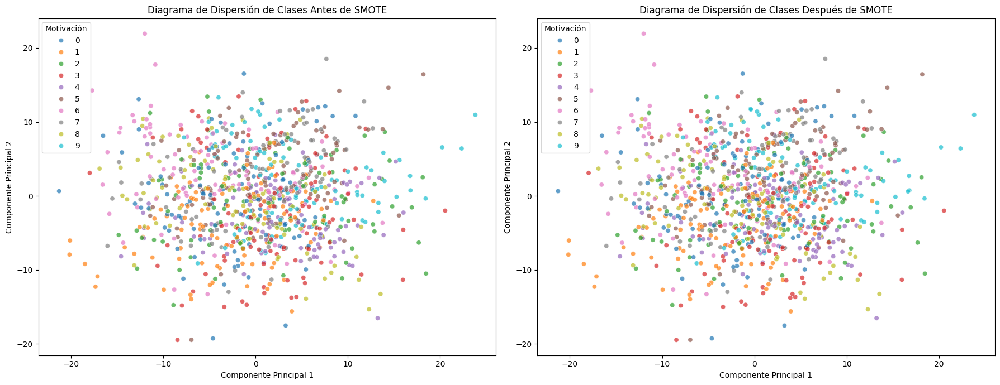

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE
from sklearn.datasets import make_classification
import pandas as pd

X, y = make_classification(n_classes=10, n_samples=1000, n_features=20, n_informative=10, n_redundant=10, random_state=42)

y = pd.Series(y)

# Aplicar PCA para reducir la dimensionalidad a 2 componentes
pca = PCA(n_components=2)
X_pca_before = pca.fit_transform(X)

# Crear un DataFrame para la visualización antes de SMOTE
df_pca_before = pd.DataFrame(X_pca_before, columns=['PCA1', 'PCA2'])
df_pca_before['Motivacion'] = y

# Imprimir el tamaño del dataset antes de SMOTE
print(f"Tamaño del dataset original: {X.shape[0]}")

# Aplicar SMOTE
smote = SMOTE(random_state=42, k_neighbors=5, sampling_strategy='auto')
X_res, y_res = smote.fit_resample(X, y)

# Imprimir el tamaño del dataset después de SMOTE
print(f"Tamaño del dataset después de SMOTE: {X_res.shape[0]}")

# Aplicar PCA a los datos re-muestreados
X_pca_after = pca.transform(X_res)

# Crear un DataFrame para la visualización después de SMOTE
df_pca_after = pd.DataFrame(X_pca_after, columns=['PCA1', 'PCA2'])
df_pca_after['Motivacion'] = y_res

# Crear las gráficas
fig, ax = plt.subplots(1, 2, figsize=(18, 7))

# Diagrama de dispersión antes de SMOTE
sns.scatterplot(data=df_pca_before, x='PCA1', y='PCA2', hue='Motivacion', palette='tab10', alpha=0.7, ax=ax[0])
ax[0].set_title('Diagrama de Dispersión de Clases Antes de SMOTE')
ax[0].set_xlabel('Componente Principal 1')
ax[0].set_ylabel('Componente Principal 2')
ax[0].legend(title='Motivación')

# Diagrama de dispersión después de SMOTE
sns.scatterplot(data=df_pca_after, x='PCA1', y='PCA2', hue='Motivacion', palette='tab10', alpha=0.7, ax=ax[1])
ax[1].set_title('Diagrama de Dispersión de Clases Después de SMOTE')
ax[1].set_xlabel('Componente Principal 1')
ax[1].set_ylabel('Componente Principal 2')
ax[1].legend(title='Motivación')

plt.tight_layout()
plt.show()


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42)


In [ ]:
# 5. Crear Pipelines para KNN y SVM
pipeline_knn = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=5)),  # Ajustamos n_components según las características restantes
    ('knn', KNeighborsClassifier())
])

pipeline_svm = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=5)),
    ('svm', SVC())
])


In [ ]:
# 6. Configurar GridSearchCV para ambos modelos
param_grid_knn = {
    'knn__n_neighbors': [3, 5, 7],
    'knn__weights': ['uniform', 'distance'],
    'knn__metric': ['euclidean', 'manhattan']
}

param_grid_svm = {
    'svm__C': [0.1, 1, 10],
    'svm__kernel': ['linear', 'rbf', 'poly'],
    'svm__gamma': ['scale', 'auto']
}


In [ ]:
# 7. Realizar la búsqueda de hiperparámetros
grid_knn = GridSearchCV(pipeline_knn, param_grid_knn, cv=5, scoring='accuracy')
grid_svm = GridSearchCV(pipeline_svm, param_grid_svm, cv=5, scoring='accuracy')

grid_knn.fit(X_train, y_train)
grid_svm.fit(X_train, y_train)


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('pca', PCA(n_components=5)),
                                       ('svm', SVC())]),
             param_grid={'svm__C': [0.1, 1, 10],
                         'svm__gamma': ['scale', 'auto'],
                         'svm__kernel': ['linear', 'rbf', 'poly']},
             scoring='accuracy')

In [ ]:
# Obtener los mejores estimadores
best_knn = grid_knn.best_estimator_
best_svm = grid_svm.best_estimator_

In [ ]:
# 9. Evaluar el rendimiento en el conjunto de prueba
y_pred_knn = best_knn.predict(X_test)
y_pred_svm = best_svm.predict(X_test)

print("KNN Classification Report:")
print(classification_report(y_test, y_pred_knn))

print("SVM Classification Report:")
print(classification_report(y_test, y_pred_svm))

KNN Classification Report:
              precision    recall  f1-score   support

           1       0.97      1.00      0.99        35
           2       1.00      1.00      1.00        32
           3       0.93      0.97      0.95        40
           4       0.90      1.00      0.95        27
           5       0.82      0.88      0.85        41
           6       0.85      0.89      0.87        38
           7       0.82      0.78      0.80        41
           8       0.63      0.75      0.68        36
           9       0.68      0.70      0.69        40
          10       0.76      0.45      0.57        42

    accuracy                           0.83       372
   macro avg       0.84      0.84      0.83       372
weighted avg       0.83      0.83      0.82       372

SVM Classification Report:
              precision    recall  f1-score   support

           1       0.71      0.97      0.82        35
           2       1.00      1.00      1.00        32
           3       0.74 

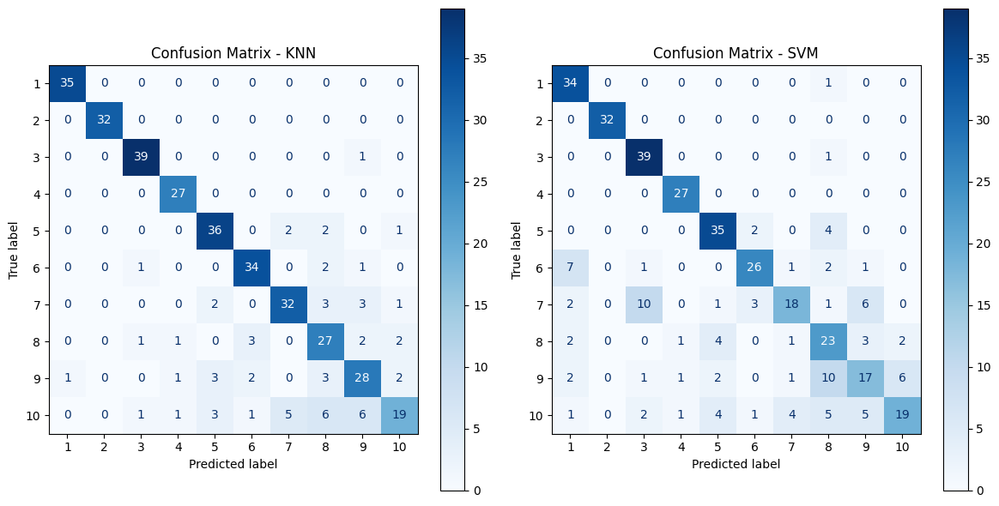

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix, classification_report, accuracy_score
import numpy as np

fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Matriz de Confusión para KNN
cm_knn = confusion_matrix(y_test, y_pred_knn)
disp_knn = ConfusionMatrixDisplay(confusion_matrix=cm_knn, display_labels=np.unique(y_test))
disp_knn.plot(ax=ax[0], cmap='Blues', values_format='d')
ax[0].set_title('Confusion Matrix - KNN')

# Matriz de Confusión para SVM
cm_svm = confusion_matrix(y_test, y_pred_svm)
disp_svm = ConfusionMatrixDisplay(confusion_matrix=cm_svm, display_labels=np.unique(y_test))
disp_svm.plot(ax=ax[1], cmap='Blues', values_format='d')
ax[1].set_title('Confusion Matrix - SVM')

plt.tight_layout()
plt.show()


In [ ]:
print("KNN Classification Report:")
print(classification_report(y_test, y_pred_knn))

print("SVM Classification Report:")
print(classification_report(y_test, y_pred_svm))

KNN Classification Report:
              precision    recall  f1-score   support

           1       0.97      1.00      0.99        35
           2       1.00      1.00      1.00        32
           3       0.93      0.97      0.95        40
           4       0.90      1.00      0.95        27
           5       0.82      0.88      0.85        41
           6       0.85      0.89      0.87        38
           7       0.82      0.78      0.80        41
           8       0.63      0.75      0.68        36
           9       0.68      0.70      0.69        40
          10       0.76      0.45      0.57        42

    accuracy                           0.83       372
   macro avg       0.84      0.84      0.83       372
weighted avg       0.83      0.83      0.82       372

SVM Classification Report:
              precision    recall  f1-score   support

           1       0.71      0.97      0.82        35
           2       1.00      1.00      1.00        32
           3       0.74 

In [ ]:
print(f"Accuracy KNN: {accuracy_score(y_test, y_pred_knn)}")
print(f"Accuracy SVM: {accuracy_score(y_test, y_pred_svm)}")

Accuracy KNN: 0.8306451612903226
Accuracy SVM: 0.7258064516129032


In [ ]:
df.columns

Index(['sisben', 'razon', 'r_carrera', 'm_residencia', 'p_profesores',
       'per_profesores', 'motivacion', 'habilidades_pa', 'campus',
       'recomendación_u'],
      dtype='object')

In [ ]:
df.head()

,sisben,razon,r_carrera,m_residencia,p_profesores,per_profesores,motivacion,habilidades_pa,campus,recomendación_u
0,25,11,17,19,8,10,10,9,9,9
1,27,21,17,4,6,10,4,10,10,10
2,27,21,17,6,8,8,10,8,8,9
3,0,21,17,18,5,10,10,7,10,6
4,2,21,8,8,5,5,6,6,8,6


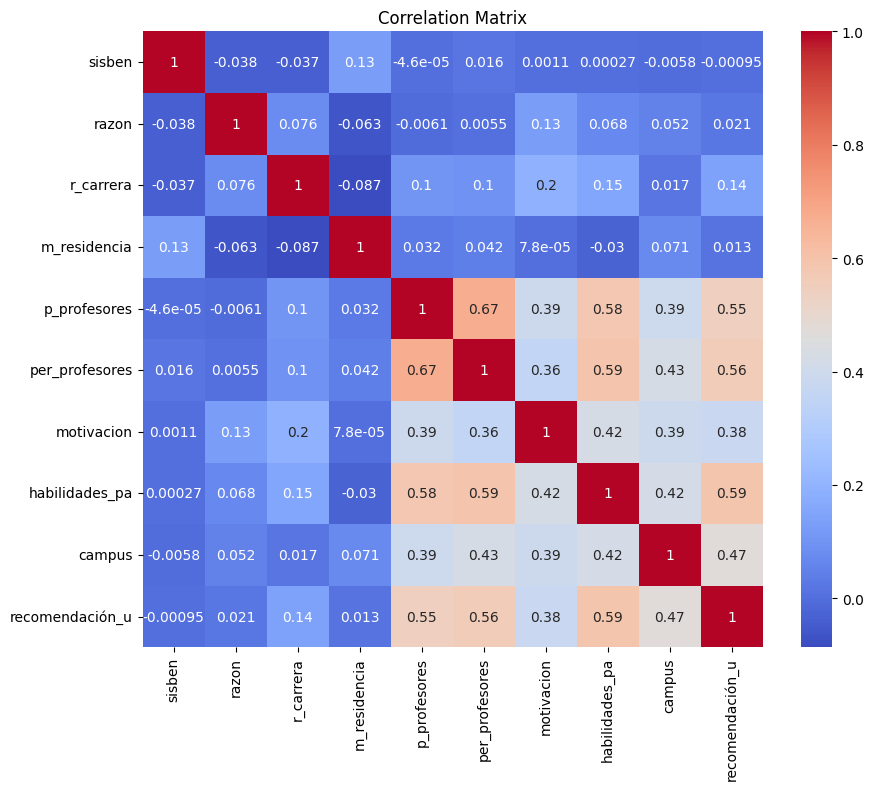

In [ ]:
plt.figure(figsize=(10,8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [ ]:
# Guardar el DataFrame con ruido añadido como un archivo Excel
df.to_excel('DF_final_numerico_score.xlsx', index=False)


In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
import pandas as pd

# Evaluación del modelo KNN
print("Evaluación KNN:")
print("Matriz de Confusión:")
print(confusion_matrix(y_test, y_pred_knn))
print("Precisión:", accuracy_score(y_test, y_pred_knn))
print("Reporte de Clasificación:\n", classification_report(y_test, y_pred_knn))

# Evaluación del modelo SVM
print("\nEvaluación SVM:")
print("Matriz de Confusión:")
print(confusion_matrix(y_test, y_pred_svm))
print("Precisión:", accuracy_score(y_test, y_pred_svm))
print("Reporte de Clasificación:\n", classification_report(y_test, y_pred_svm))


Evaluación KNN:
Matriz de Confusión:
[[35  0  0  0  0  0  0  0  0  0]
 [ 0 32  0  0  0  0  0  0  0  0]
 [ 0  0 39  0  0  0  0  0  1  0]
 [ 0  0  0 27  0  0  0  0  0  0]
 [ 0  0  0  0 36  0  2  2  0  1]
 [ 0  0  1  0  0 34  0  2  1  0]
 [ 0  0  0  0  2  0 32  3  3  1]
 [ 0  0  1  1  0  3  0 27  2  2]
 [ 1  0  0  1  3  2  0  3 28  2]
 [ 0  0  1  1  3  1  5  6  6 19]]
Precisión: 0.8306451612903226
Reporte de Clasificación:
               precision    recall  f1-score   support

           1       0.97      1.00      0.99        35
           2       1.00      1.00      1.00        32
           3       0.93      0.97      0.95        40
           4       0.90      1.00      0.95        27
           5       0.82      0.88      0.85        41
           6       0.85      0.89      0.87        38
           7       0.82      0.78      0.80        41
           8       0.63      0.75      0.68        36
           9       0.68      0.70      0.69        40
          10       0.76      0.45 

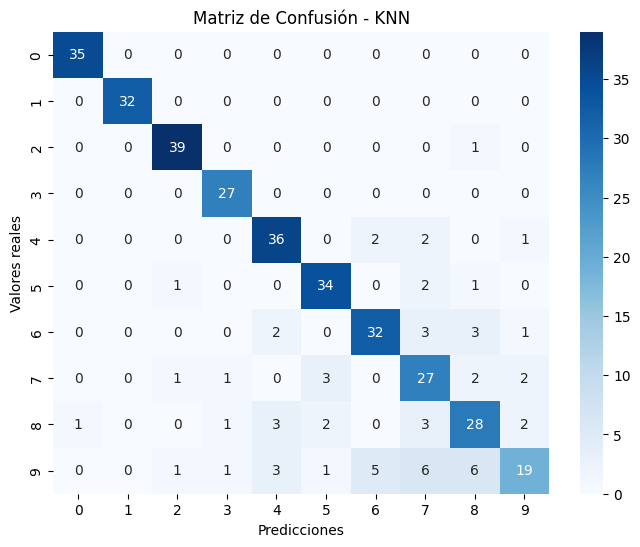

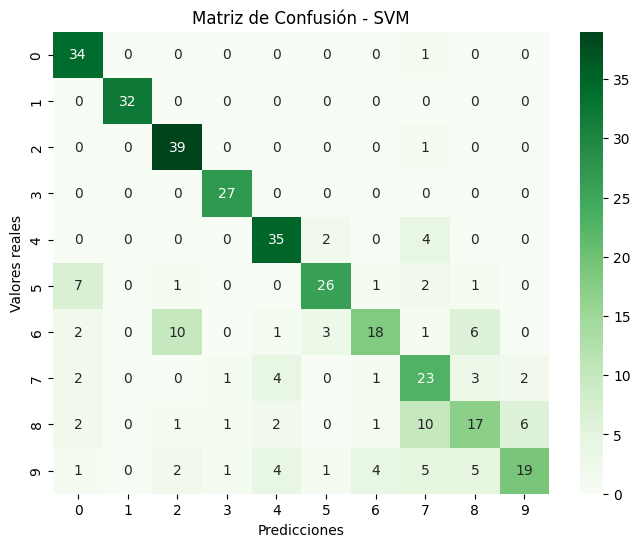

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Matriz de confusión KNN
conf_matrix_knn = confusion_matrix(y_test, y_pred_knn)
plt.figure(figsize=(8,6))
sns.heatmap(conf_matrix_knn, annot=True, fmt="d", cmap="Blues")
plt.title("Matriz de Confusión - KNN")
plt.ylabel("Valores reales")
plt.xlabel("Predicciones")
plt.show()

# Matriz de confusión SVM
conf_matrix_svm = confusion_matrix(y_test, y_pred_svm)
plt.figure(figsize=(8,6))
sns.heatmap(conf_matrix_svm, annot=True, fmt="d", cmap="Greens")
plt.title("Matriz de Confusión - SVM")
plt.ylabel("Valores reales")
plt.xlabel("Predicciones")
plt.show()


In [ ]:
data = {
    "Modelo": ["KNN", "SVM"],
    "Precisión": [accuracy_score(y_test, y_pred_knn), accuracy_score(y_test, y_pred_svm)],
    # Agrega más métricas si lo deseas
}

resultados_df = pd.DataFrame(data)
print(resultados_df)


  Modelo  Precisión
0    KNN   0.830645
1    SVM   0.725806


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Supongamos que X_train, X_test, y_train, y_test están definidos
# Entrenar el modelo KNN
knn_model = KNeighborsClassifier(n_neighbors=5)  # Puedes ajustar el parámetro n_neighbors
knn_model.fit(X_train, y_train)

# Entrenar el modelo SVM
svm_model = SVC(kernel='linear', probability=True)  # 'probability=True' es necesario para ROC
svm_model.fit(X_train, y_train)


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVC(kernel='linear', probability=True)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


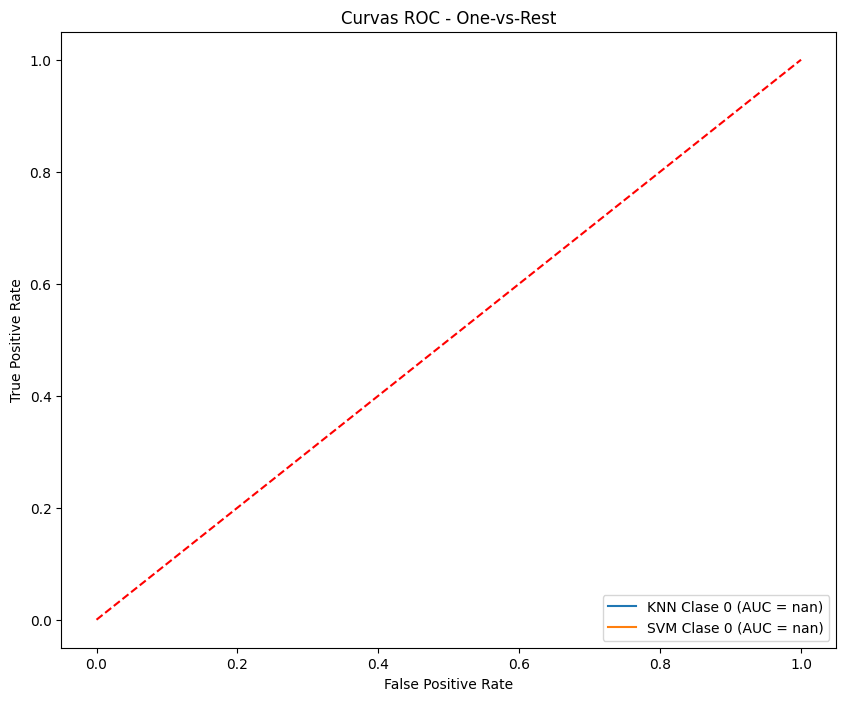

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Binarizar las clases (One-vs-Rest)
classes = list(set(y_test))  # Extraer las clases únicas
y_test_binarized = label_binarize(y_test, classes=classes)

# Obtener las probabilidades para KNN (se requiere `predict_proba`)
y_score_knn = knn_model.predict_proba(X_test)

# Obtener las probabilidades para SVM (usamos decision_function para obtener los valores de decisión)
y_score_svm = svm_model.decision_function(X_test)

# Graficar curvas ROC para cada clase
plt.figure(figsize=(10, 8))

for i in range(len(classes)):
    # ROC para KNN
    fpr_knn, tpr_knn, _ = roc_curve(y_test_binarized[:, i], y_score_knn[:, i])
    roc_auc_knn = auc(fpr_knn, tpr_knn)
    plt.plot(fpr_knn, tpr_knn, label='KNN Clase %d (AUC = %0.2f)' % (i, roc_auc_knn))

    # ROC para SVM
    fpr_svm, tpr_svm, _ = roc_curve(y_test_binarized[:, i], y_score_svm[:, i])
    roc_auc_svm = auc(fpr_svm, tpr_svm)
    plt.plot(fpr_svm, tpr_svm, label='SVM Clase %d (AUC = %0.2f)' % (i, roc_auc_svm))

# Graficar la línea diagonal de referencia
plt.plot([0, 1], [0, 1], color='red', linestyle='--')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Curvas ROC - One-vs-Rest')
plt.legend(loc="lower right")
plt.show()


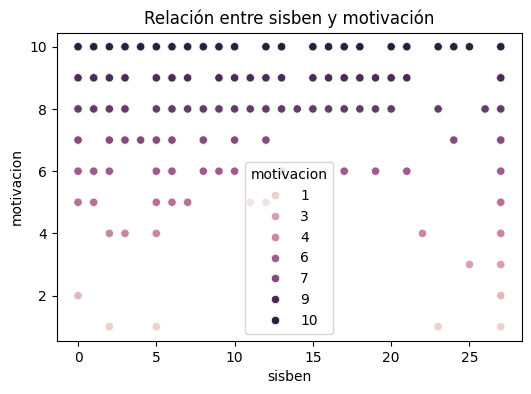

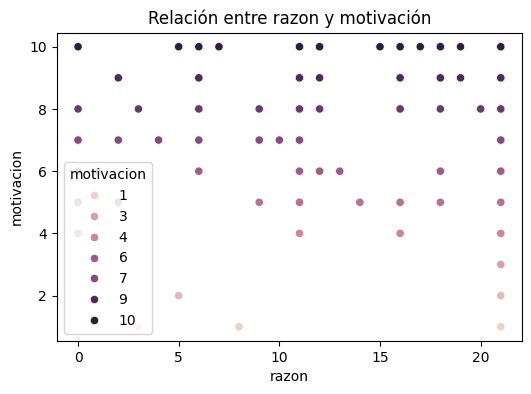

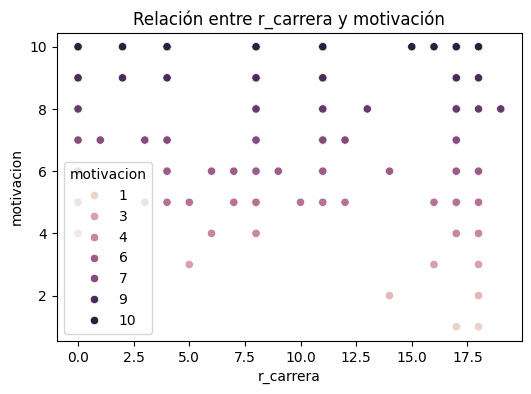

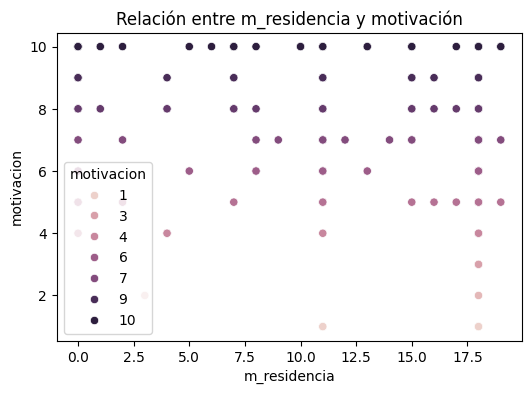

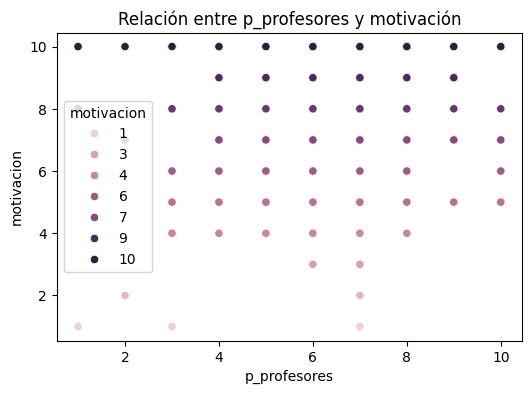

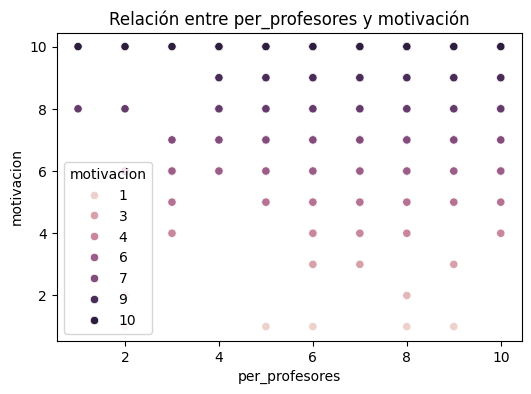

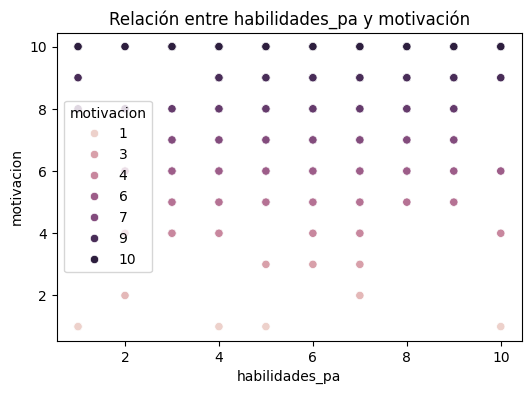

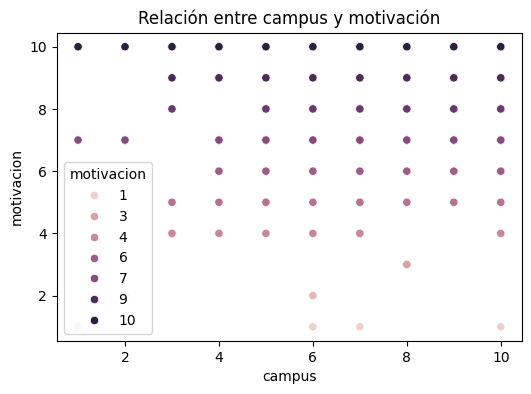

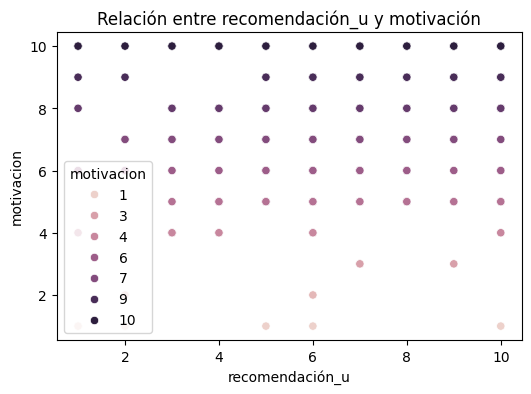

In [ ]:
for column in df.columns:
    if column != 'motivacion':
        plt.figure(figsize=(6,4))
        sns.scatterplot(x=df[column], y=df['motivacion'], data=df, hue = "motivacion")
        plt.title(f'Relación entre {column} y motivación')
        plt.show()

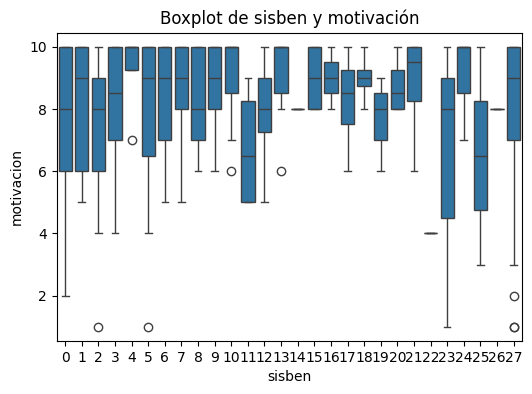

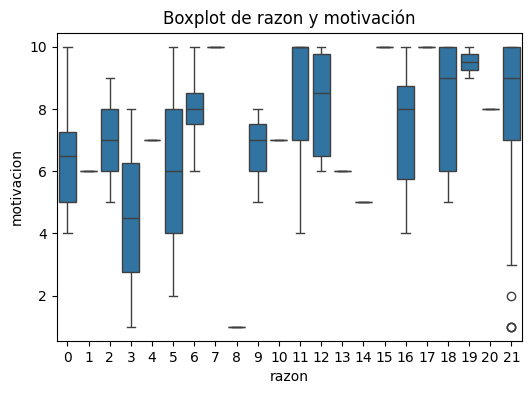

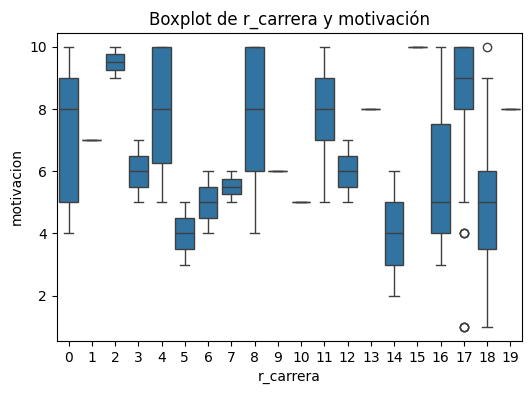

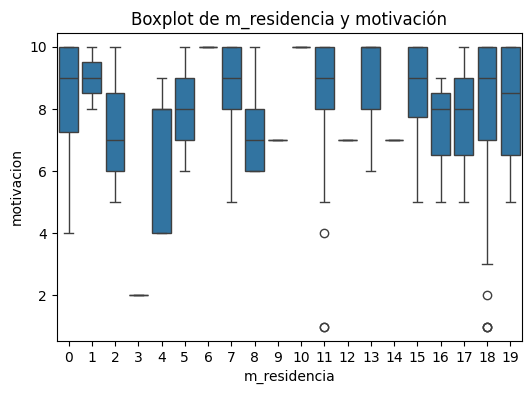

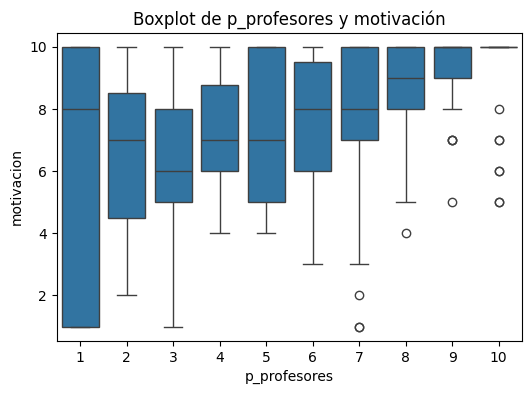

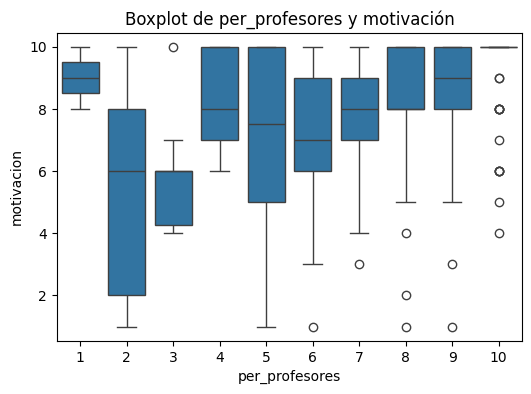

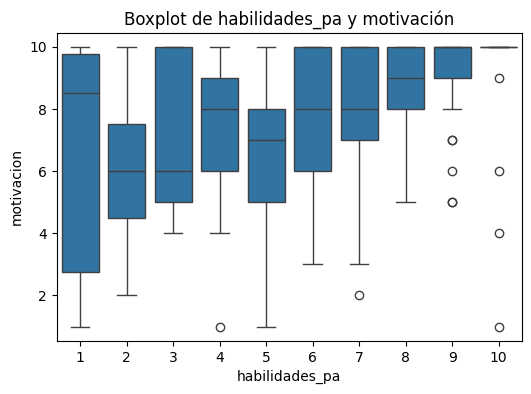

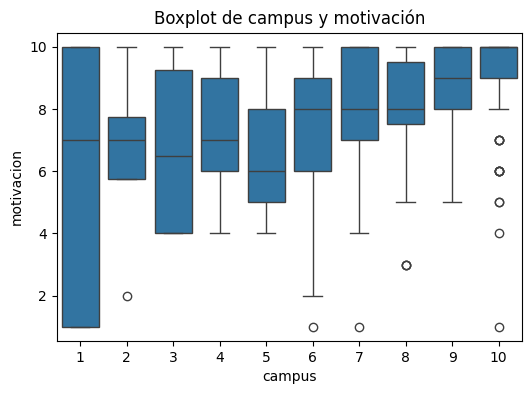

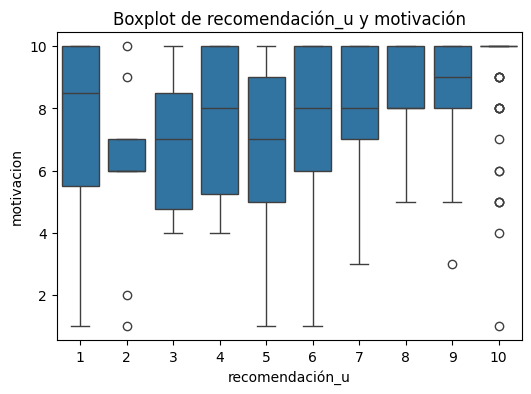

In [ ]:
for column in df.columns:
    if column != 'motivacion':
        plt.figure(figsize=(6,4))
        sns.boxplot(x=df[column], y=df['motivacion'])
        plt.title(f'Boxplot de {column} y motivación')
        plt.show()

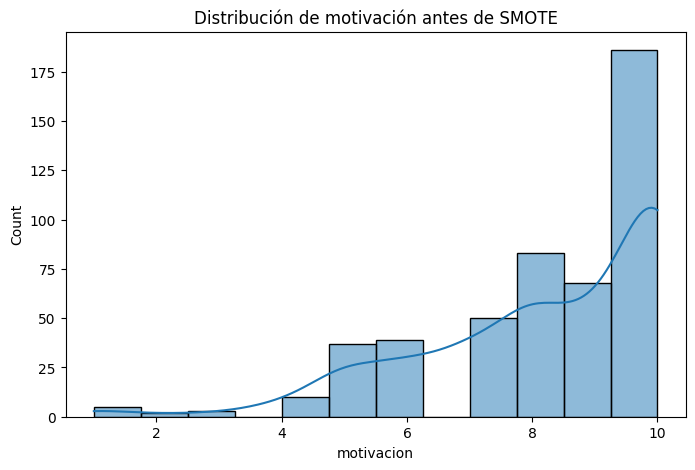

In [ ]:
plt.figure(figsize=(8,5))
sns.histplot(df['motivacion'], kde=True)
plt.title('Distribución de motivación antes de SMOTE')
plt.show()

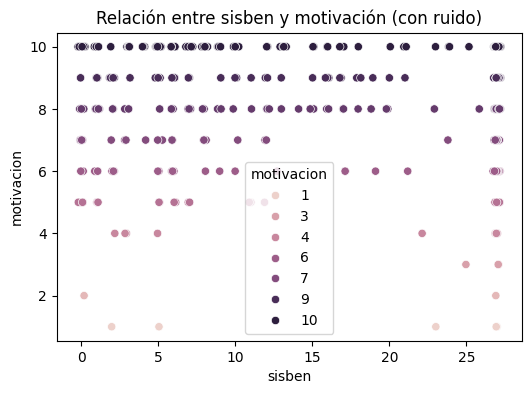

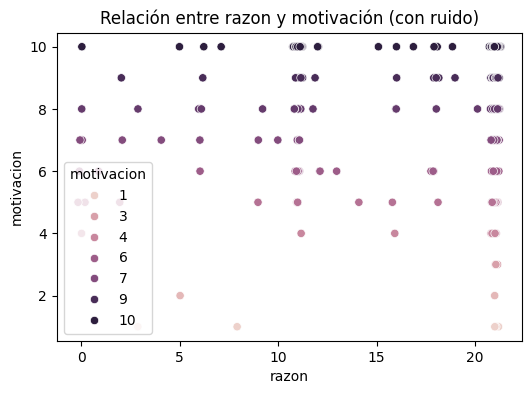

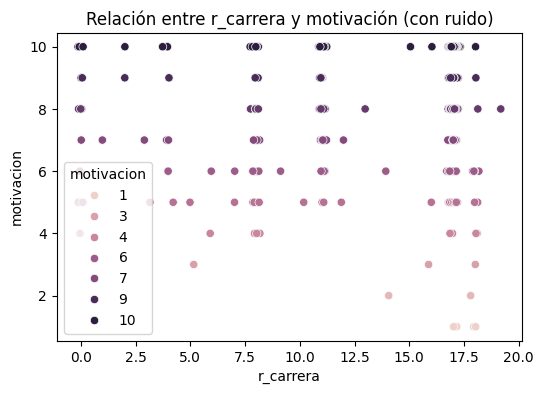

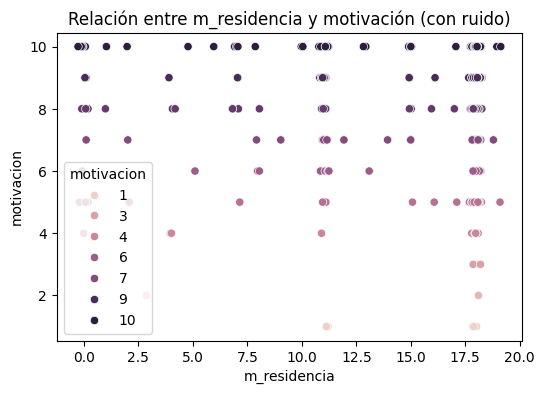

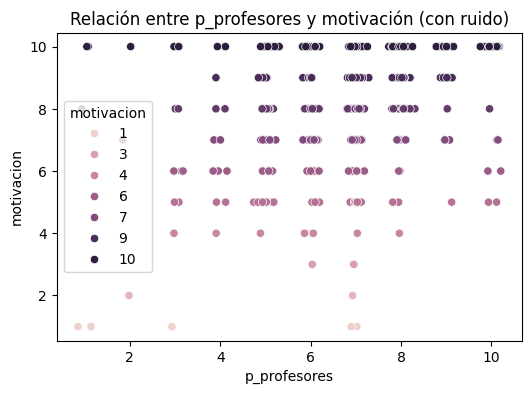

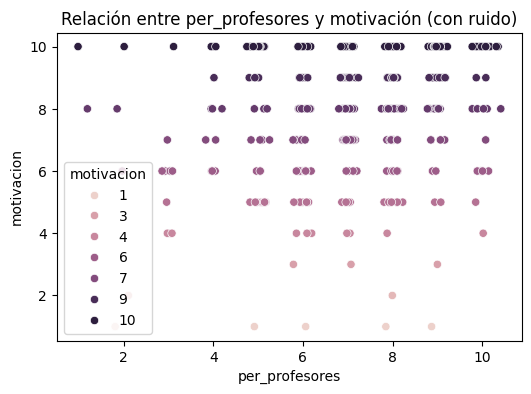

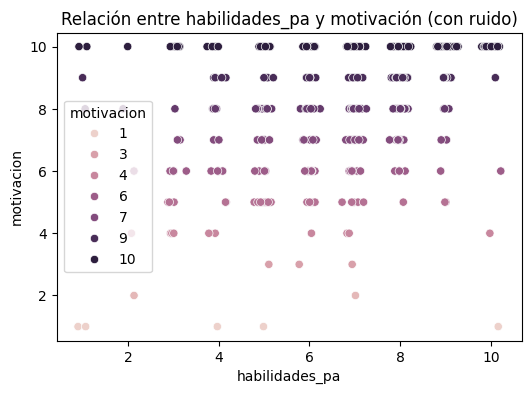

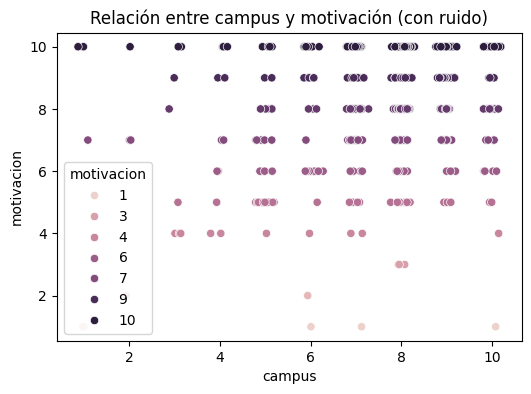

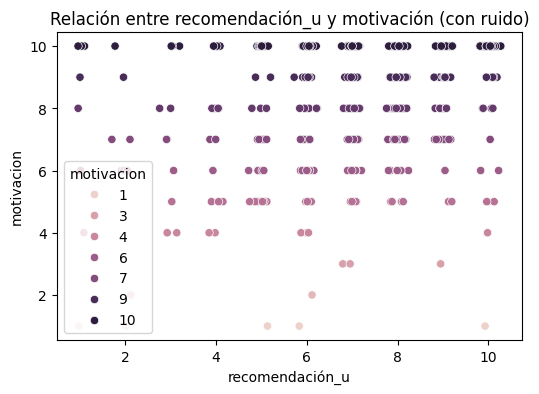

In [ ]:
df_noisy = df.copy()
noise_factor = 0.1  # Ajusta el nivel de ruido (puedes aumentarlo o disminuirlo)
for column in df_noisy.columns:
    if df_noisy[column].dtype != 'object' and column != 'motivacion':
        df_noisy[column] += np.random.normal(0, noise_factor, df_noisy[column].shape)

# 2. Graficar las variables con ruido añadido
for column in df_noisy.columns:
    if column != 'motivacion':
        plt.figure(figsize=(6,4))
        sns.scatterplot(x=df_noisy[column], y=df_noisy['motivacion'], hue=df_noisy['motivacion'])
        plt.title(f'Relación entre {column} y motivación (con ruido)')
        plt.show()